In [ ]:
!pip install open3d
import cv2

In [46]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [47]:
import os

pcd_files=[]
folder_path='/content/drive/MyDrive/cv ass2/lidar_scans'

for file in os.listdir(folder_path):
    if file.endswith('.pcd'):
        pcd_files.append(os.path.join(folder_path, file))

In [ ]:
pcd_files

In [49]:
import numpy as np

def read_pcd_file(file_path):
  points = []
  with open(file_path, 'r') as file:
    for line in file:
        values = line.strip().split()
        points.append([float(values[0]), float(values[1]), float(values[2])])
  return np.array(points)


In [50]:
import numpy as np
from scipy.linalg import svd
import open3d as o3d

def read_pcd_file(file_path):
    pcd = o3d.io.read_point_cloud(file_path)
    points = np.asarray(pcd.points)
    return points






In [51]:
def compute_plane_normal_and_offset(points):
    mean_point = np.mean(points, axis=0)
    centered_points = points - mean_point
    U, S, Vt = svd(centered_points, full_matrices=False)
    normal = Vt[-1, :]
    offset = np.dot(normal, mean_point)
    return normal, offset





In [52]:
import numpy as np

def read_rotation_matrix(file_path):
  with open(file_path, 'r') as file:
    data = []
    for line in file:
            # Split the line into values, convert each to float, and add to the data list
      data.append([float(value) for value in line.strip().split()])
    return np.array(data)


def read_file(file_path):
  with open(file_path,'r') as file:
    data=[]
    for line in file:
      data.append(float(line))
    return np.array(data)

In [53]:
dict={}
camera_parameters_folder='/content/drive/MyDrive/cv ass2/camera_parameters'

In [54]:
import re

for folder_name in os.listdir(camera_parameters_folder):

  match = re.search(r'frame_(\d+)\.jpeg', folder_name)
  if not match:
    continue

  number = int(match.group(1))
  folder_path = os.path.join(camera_parameters_folder, folder_name)
  dict[number]={}

  for file_name in ['camera_normals.txt', 'rotation_vectors.txt', 'translation_vectors.txt']:
      file_path = os.path.join(folder_path, file_name)
      dict[number][file_name] = read_file(file_path)

  for file_name in ['rotation_matrix.txt']:
      file_path = os.path.join(folder_path, file_name)
      dict[number][file_name] = read_rotation_matrix(file_path)


In [55]:
for file in pcd_files:
    match = re.search(r'(\d+)\.pcd$', file)
    numbers=int(match.group(1))
    points = read_pcd_file(file)
    dict[numbers]["points"]=points
    normal, offset = compute_plane_normal_and_offset(points)
    dict[numbers]["normal_l"]=normal
    dict[numbers]["offset_l"]=offset


In [56]:
print(dict[2107]["normal_l"])

[ 0.98745566  0.06712949 -0.14291586]


In [57]:
print(dict[2107])

{'camera_normals.txt': array([ 0.27176261, -0.16526395, -0.94806799]), 'rotation_vectors.txt': array([-0.331871  , -0.11410495,  1.37357849]), 'translation_vectors.txt': array([-3.20797216, -0.04012876,  9.19848412]), 'rotation_matrix.txt': array([[ 0.19893987, -0.94157741, -0.27176261],
       [ 0.97351302,  0.15798806,  0.16526395],
       [-0.11267355, -0.29744203,  0.94806799]]), 'points': array([[10.17658806,  2.06675267, -0.90851146],
       [10.21001244,  2.06983042, -0.54596871],
       [10.18374062,  2.03121448, -0.90851146],
       [10.22696877,  2.03613019, -0.5464921 ],
       [10.27938175,  2.04283547, -0.18293612],
       [10.17121506,  1.99182725, -0.90676832],
       [10.26878643,  2.00349212, -0.18262199],
       [10.22328091,  1.9612962 , -0.54555005],
       [10.17312622,  1.9185549 , -0.90572244],
       [10.23399067,  1.92633438, -0.54575938],
       [10.28841877,  1.93286121, -0.1827267 ],
       [10.17388344,  1.88194728, -0.90519953],
       [10.22101212,  1.886

In [58]:

def dot_product(normal_l, translation_vector):
    return np.dot(normal_l, translation_vector)

In [59]:
for number, data in dict.items():
    normal_c = data['camera_normals.txt']
    translation_vector = data['translation_vectors.txt']
    offset_c = dot_product(normal_c, translation_vector)
    dict[number]['offset_c'] = offset_c

In [60]:
print(dict[2107])

{'camera_normals.txt': array([ 0.27176261, -0.16526395, -0.94806799]), 'rotation_vectors.txt': array([-0.331871  , -0.11410495,  1.37357849]), 'translation_vectors.txt': array([-3.20797216, -0.04012876,  9.19848412]), 'rotation_matrix.txt': array([[ 0.19893987, -0.94157741, -0.27176261],
       [ 0.97351302,  0.15798806,  0.16526395],
       [-0.11267355, -0.29744203,  0.94806799]]), 'points': array([[10.17658806,  2.06675267, -0.90851146],
       [10.21001244,  2.06983042, -0.54596871],
       [10.18374062,  2.03121448, -0.90851146],
       [10.22696877,  2.03613019, -0.5464921 ],
       [10.27938175,  2.04283547, -0.18293612],
       [10.17121506,  1.99182725, -0.90676832],
       [10.26878643,  2.00349212, -0.18262199],
       [10.22328091,  1.9612962 , -0.54555005],
       [10.17312622,  1.9185549 , -0.90572244],
       [10.23399067,  1.92633438, -0.54575938],
       [10.28841877,  1.93286121, -0.1827267 ],
       [10.17388344,  1.88194728, -0.90519953],
       [10.22101212,  1.886

In [61]:
import numpy as np

theta_c_list = []
theta_l_list = []
alpha_c_list = []
alpha_l_list = []

for number, data in dict.items():
    offset_c = data['offset_c']
    theta_c_temp = data['camera_normals.txt'].flatten()
    if offset_c < 0:
        theta_c_temp = -theta_c_temp
        offset_c = -offset_c
    theta_c_list.append(theta_c_temp)
    alpha_c_list.append([offset_c])

    offset_l = data['offset_l']
    theta_l_temp = data['normal_l']
    if offset_l < 0:
        theta_l_temp = -theta_l_temp
        offset_l = -offset_l
    theta_l_list.append(theta_l_temp)
    alpha_l_list.append([offset_l])


theta_c = np.vstack(theta_c_list).T
theta_l = np.vstack(theta_l_list).T
alpha_c = np.vstack(alpha_c_list)
alpha_l = np.vstack(alpha_l_list)

# Print the shapes to check the result
print("theta_c shape:", theta_c.shape)
print("theta_l shape:", theta_l.shape)
print("alpha_c shape:", alpha_c.shape)
print("alpha_l shape:", alpha_l.shape)




theta_c shape: (3, 38)
theta_l shape: (3, 38)
alpha_c shape: (38, 1)
alpha_l shape: (38, 1)


In [62]:

def lidar_translation_matrix(theta_c , alpha_c , alpha_l) :
    t1 = np.linalg.inv(theta_c @ theta_c.T) @ theta_c @ (alpha_c - alpha_l)

    return t1

In [63]:
lidar_translation=lidar_translation_matrix(theta_c,alpha_c,alpha_l)

In [64]:
lidar_translation

array([[ 0.08855656],
       [-0.36208144],
       [-0.59925671]])

In [65]:
def rotation_matrix(theta_l,theta_c) :

    U , S, V_t = np.linalg.svd(theta_l @ theta_c.T)

    R1 = V_t.T @ U.T

    return U, V_t, R1

In [66]:
U,V_t,R1=rotation_matrix(theta_l,theta_c)

In [67]:
print(R1.shape)

(3, 3)


In [68]:
np.linalg.det(R1)

0.9999999999999992

In [69]:
t1_col = lidar_translation.reshape(3, 1)
transformation_matrix = np.vstack((np.hstack((R1, t1_col)), [0, 0, 0, 1]))

print("Transformation Matrix:")
print(transformation_matrix)

Transformation Matrix:
[[-1.75158876e-01 -9.84540172e-01  1.36164316e-04  8.85565624e-02]
 [ 1.53559935e-02 -2.87025999e-03 -9.99877970e-01 -3.62081439e-01]
 [ 9.84420419e-01 -1.75135410e-01  1.56213440e-02 -5.99256711e-01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]


In [92]:
path='/content/drive/MyDrive/cv ass2/camera_parameters/camera_intrinsic.txt'
camera_intrinsic=read_rotation_matrix(path)
path='/content/drive/MyDrive/cv ass2/camera_parameters/distortion.txt'
camera_distortion=read_file(path)

In [93]:
print(camera_distortion)

[-0.0868018   0.11562874  0.00722601 -0.00022335 -0.05891062]


In [114]:
def plot_lidar_on_image(image_path, points_pixel_coordinates):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert from BGR to RGB
    plt.imshow(image)
    plt.scatter(points_pixel_coordinates[:, 0], points_pixel_coordinates[:, 1], s=1, c='r')
    plt.axis('off')  # Hide the axis
    plt.show()

def project_points_to_image_plane(points_camera_frame, intrinsic_matrix):
    # Project the points onto the image plane
    points_image_plane = np.dot(intrinsic_matrix, points_camera_frame.T).T
    # Normalize the points by the third coordinate to get pixel coordinates
    points_pixel_coordinates = points_image_plane[:, :2] / points_image_plane[:, 2:3]
    return points_pixel_coordinates

def transform_lidar_to_camera(points, transformation_matrix):
    # Add a column of ones to the points to allow for the affine transformation
    points_homogeneous = np.hstack((points, np.ones((points.shape[0], 1))))
    # Transform the points
    points_camera_frame = np.dot(transformation_matrix, points_homogeneous.T).T
    # Remove the homogeneous coordinate
    points_camera_frame = points_camera_frame[:, :3]
    return points_camera_frame




In [117]:
def plot_lidar_on_image_and_save(image_path, points_pixel_coordinates, output_path):
    image = cv2.imread(image_path)
    # Draw the LiDAR points on the image
    for point in points_pixel_coordinates:
        cv2.circle(image, (int(point[0]), int(point[1])), radius=1, color=(0, 0, 255), thickness=-1)
    # Save the image with the plotted points
    cv2.imwrite(output_path, image)

/content/drive/MyDrive/cv ass2/camera_images/frame_457.jpeg


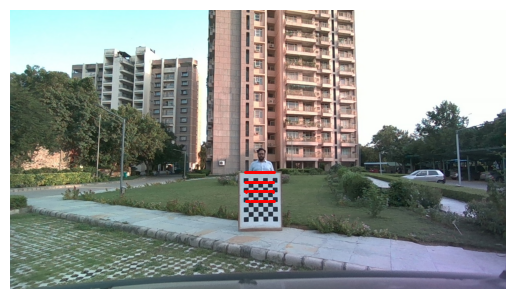

/content/drive/MyDrive/cv ass2/camera_images/frame_548.jpeg


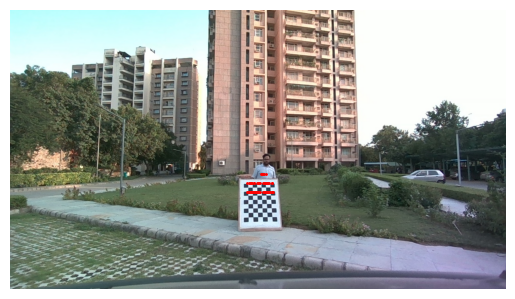

/content/drive/MyDrive/cv ass2/camera_images/frame_339.jpeg


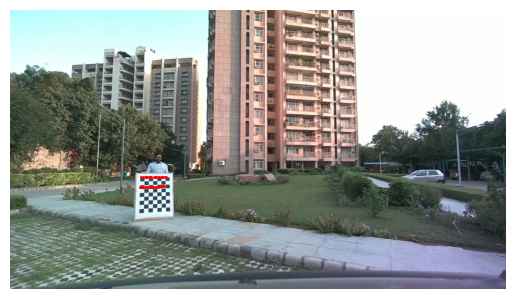

/content/drive/MyDrive/cv ass2/camera_images/frame_2800.jpeg


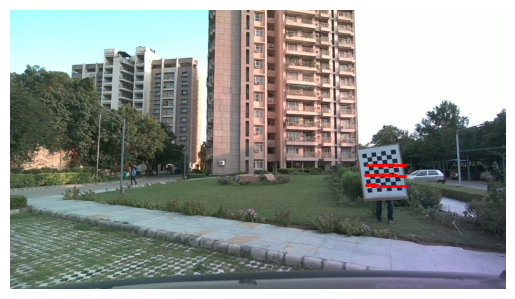

/content/drive/MyDrive/cv ass2/camera_images/frame_1850.jpeg


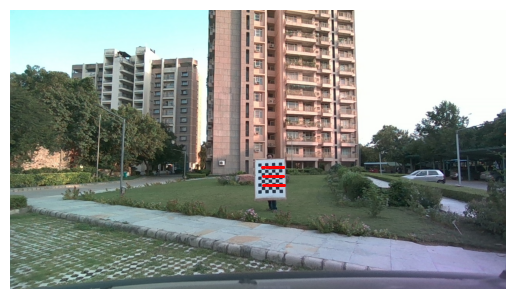

/content/drive/MyDrive/cv ass2/camera_images/frame_1558.jpeg


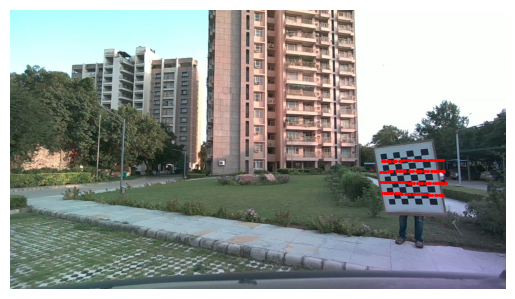

/content/drive/MyDrive/cv ass2/camera_images/frame_1153.jpeg


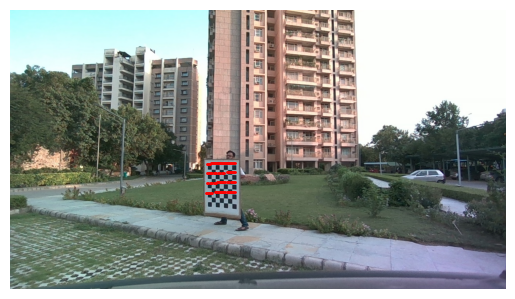

/content/drive/MyDrive/cv ass2/camera_images/frame_1061.jpeg


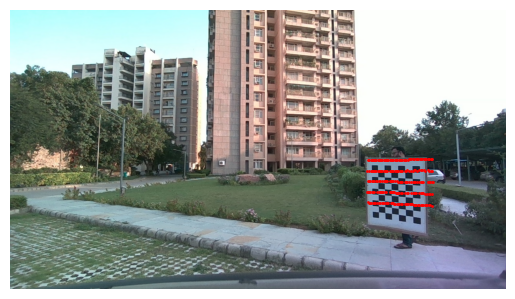

/content/drive/MyDrive/cv ass2/camera_images/frame_2991.jpeg


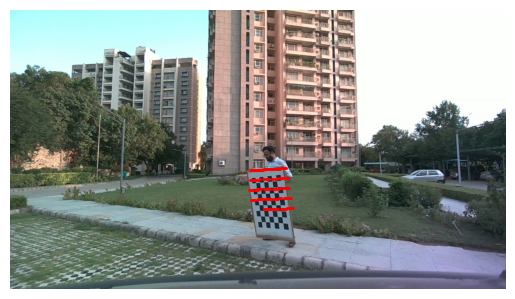

/content/drive/MyDrive/cv ass2/camera_images/frame_2030.jpeg


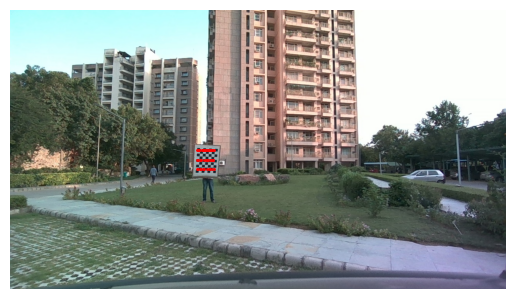

/content/drive/MyDrive/cv ass2/camera_images/frame_1163.jpeg


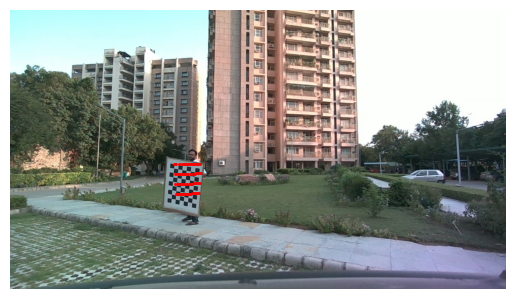

/content/drive/MyDrive/cv ass2/camera_images/frame_1698.jpeg


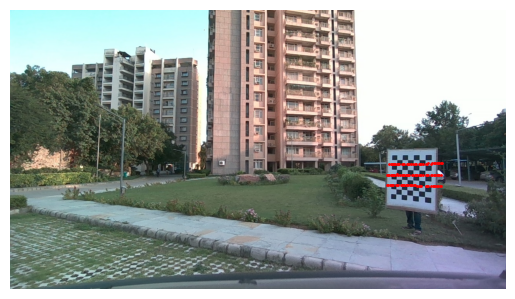

/content/drive/MyDrive/cv ass2/camera_images/frame_2962.jpeg


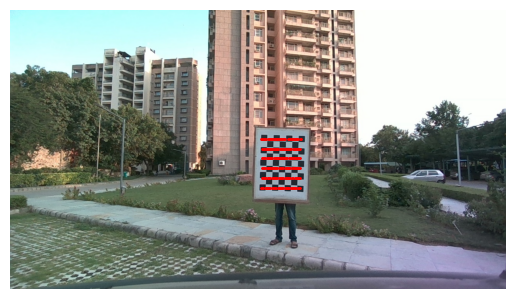

/content/drive/MyDrive/cv ass2/camera_images/frame_256.jpeg


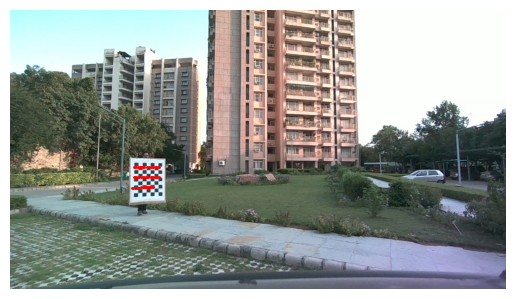

/content/drive/MyDrive/cv ass2/camera_images/frame_1580.jpeg


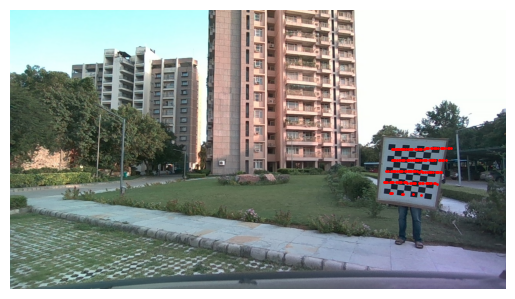

/content/drive/MyDrive/cv ass2/camera_images/frame_1430.jpeg


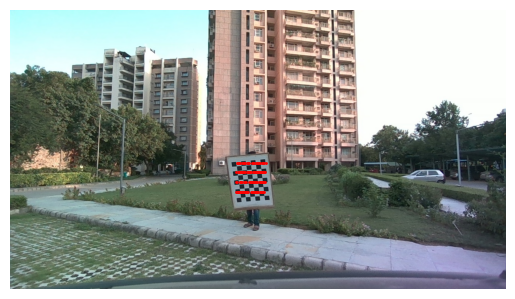

/content/drive/MyDrive/cv ass2/camera_images/frame_2725.jpeg


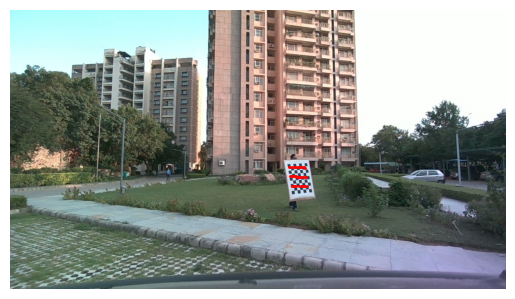

/content/drive/MyDrive/cv ass2/camera_images/frame_607.jpeg


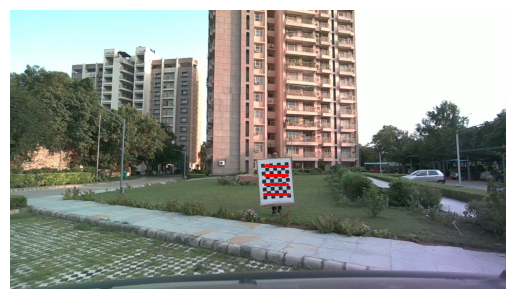

/content/drive/MyDrive/cv ass2/camera_images/frame_1816.jpeg


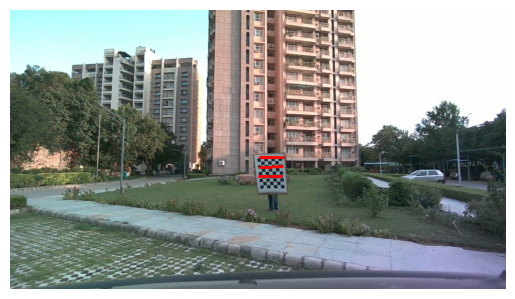

/content/drive/MyDrive/cv ass2/camera_images/frame_1725.jpeg


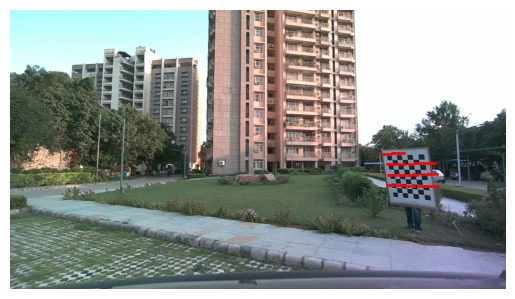

/content/drive/MyDrive/cv ass2/camera_images/frame_3329.jpeg


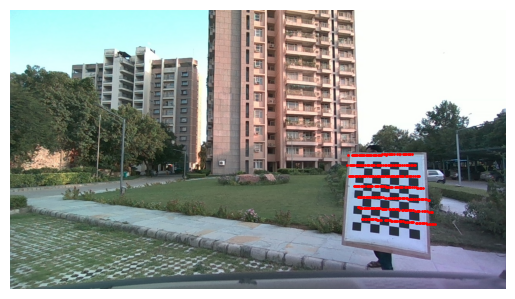

/content/drive/MyDrive/cv ass2/camera_images/frame_595.jpeg


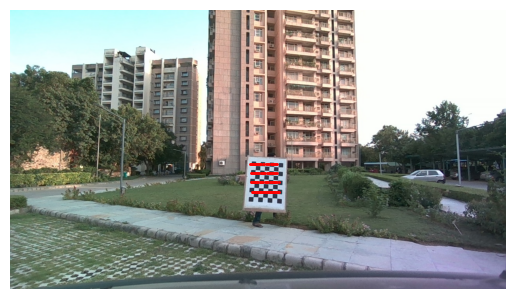

/content/drive/MyDrive/cv ass2/camera_images/frame_2107.jpeg


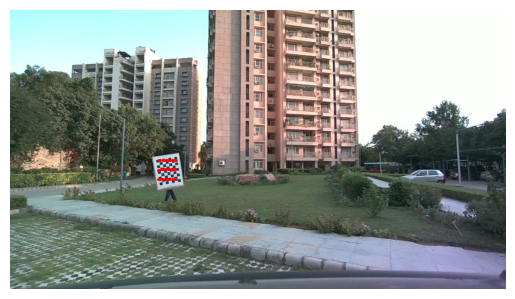

/content/drive/MyDrive/cv ass2/camera_images/frame_1638.jpeg


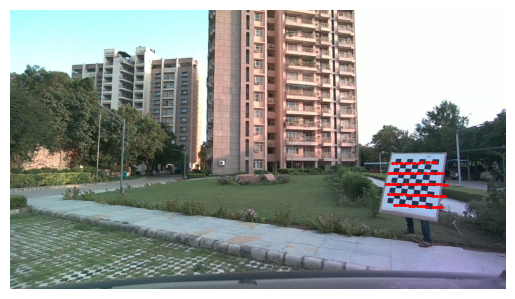

/content/drive/MyDrive/cv ass2/camera_images/frame_1093.jpeg


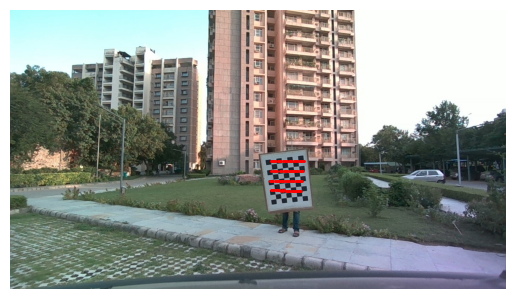

/content/drive/MyDrive/cv ass2/camera_images/frame_795.jpeg


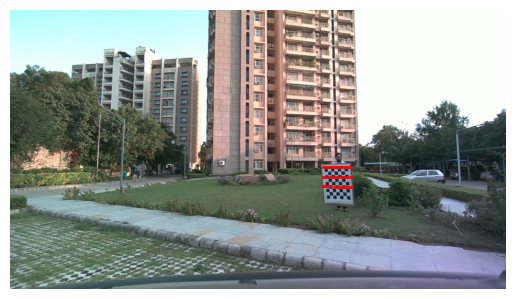

/content/drive/MyDrive/cv ass2/camera_images/frame_1195.jpeg


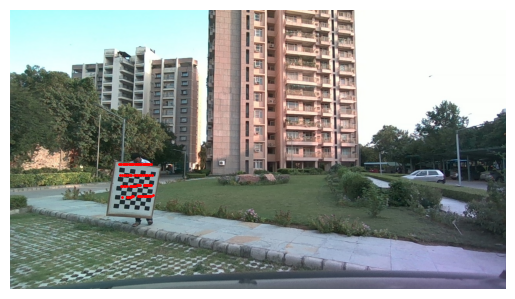

/content/drive/MyDrive/cv ass2/camera_images/frame_2717.jpeg


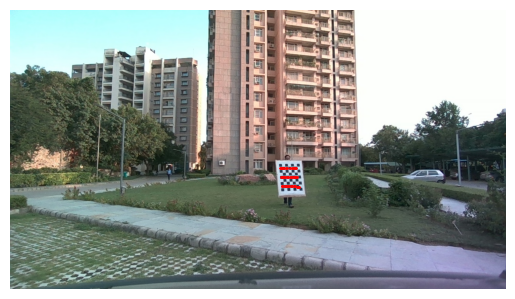

/content/drive/MyDrive/cv ass2/camera_images/frame_690.jpeg


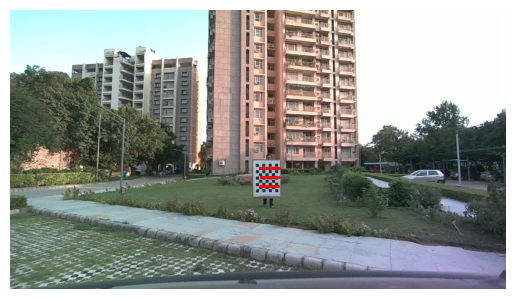

/content/drive/MyDrive/cv ass2/camera_images/frame_1139.jpeg


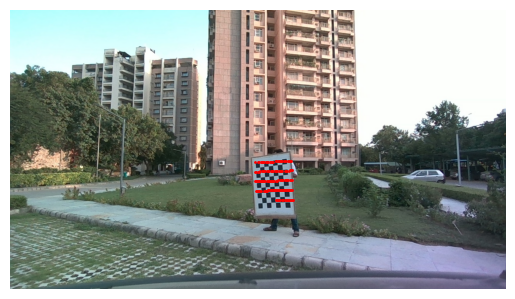

/content/drive/MyDrive/cv ass2/camera_images/frame_1798.jpeg


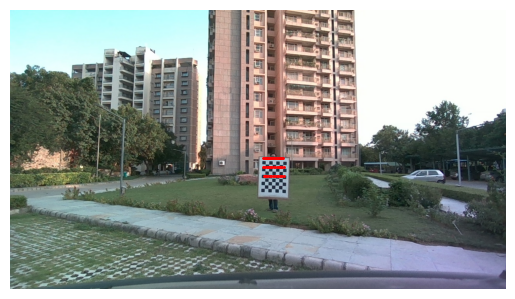

/content/drive/MyDrive/cv ass2/camera_images/frame_639.jpeg


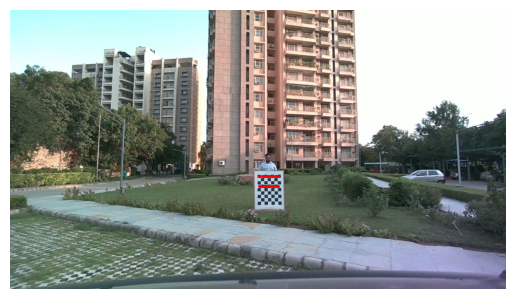

/content/drive/MyDrive/cv ass2/camera_images/frame_1075.jpeg


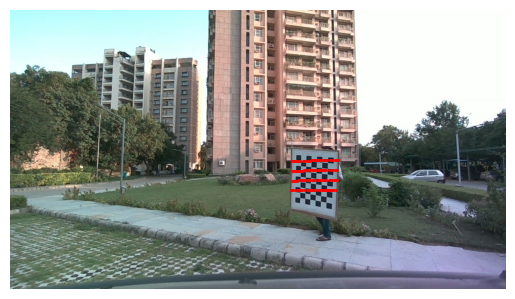

/content/drive/MyDrive/cv ass2/camera_images/frame_2771.jpeg


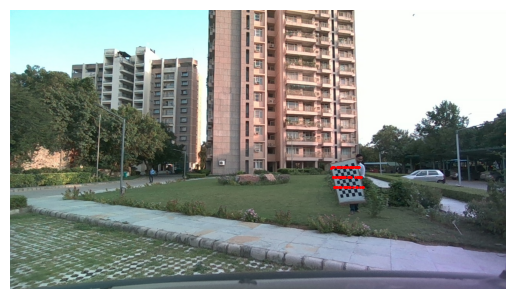

/content/drive/MyDrive/cv ass2/camera_images/frame_1473.jpeg


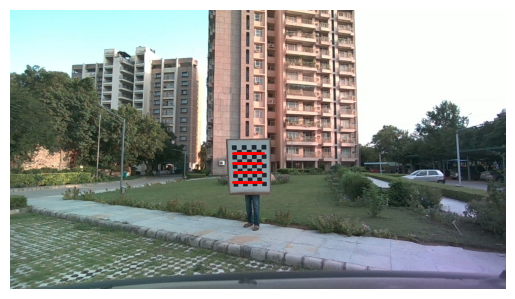

/content/drive/MyDrive/cv ass2/camera_images/frame_1366.jpeg


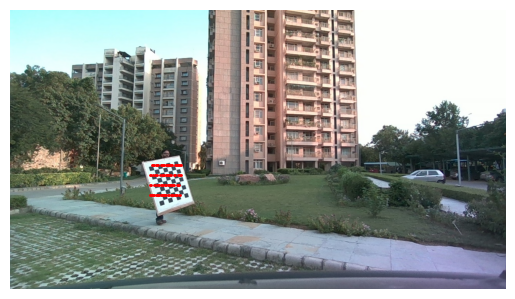

/content/drive/MyDrive/cv ass2/camera_images/frame_812.jpeg


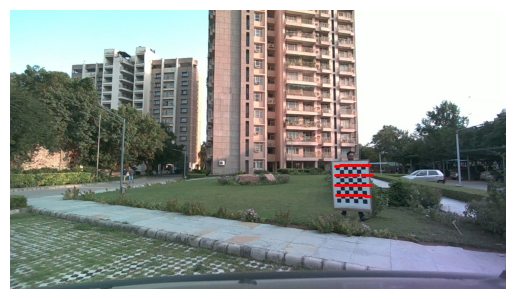

/content/drive/MyDrive/cv ass2/camera_images/frame_2822.jpeg


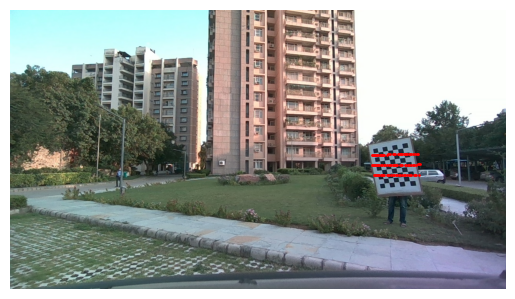

In [118]:
count=0
output_folder='/content/drive/MyDrive/cv ass2/mapped_lidar'

for number in dict:
  # if(count>=25):
  #   break
  points=dict[number]['points']
  image=dict[number]['image']
  print(image)
  intrinsic_matrix=camera_intrinsic
  points_camera_frame=transform_lidar_to_camera(points, transformation_matrix)
  points_pixel_coordinates=project_points_to_image_plane(points_camera_frame, intrinsic_matrix)
  plot_lidar_on_image(image, points_pixel_coordinates)
  output_path = f"{output_folder}/frame_{number}.jpg"
  plot_lidar_on_image_and_save(image, points_pixel_coordinates, output_path)
  # image = cv2.imread(image)
  # print(image)

  count+=1

In [129]:
import numpy as np
import matplotlib.pyplot as plt

def plot_normals(n_L, n_C, n_transformed):
    # Create a blank plot
    fig, ax = plt.subplots()

    # Define the position as the origin (0, 0)
    position = (0, 0)

    # Plot the normal vectors
    ax.quiver(*position, *n_L, color='r', scale=5, label='LiDAR Normal')
    ax.quiver(*position, *n_C, color='g', scale=5, label='Camera Normal')
    ax.quiver(*position, *n_transformed, color='b', scale=5, label='Transformed LiDAR Normal')

    ax.axis('equal')
    ax.legend()
    plt.show()


def cosine_distance(a, b):
    return 1 - np.dot(a, b) / (np.linalg.norm(a) * np.linalg.norm(b))







In [133]:
for number, data in dict.items():
    offset_c = data['offset_c']
    theta_c_temp = data['camera_normals.txt']
    if offset_c < 0:
        theta_c_temp = -theta_c_temp
        offset_c = -offset_c
    data['offset_c']=offset_c
    data['camera_normals.txt']=theta_c_temp


    offset_l = data['offset_l']
    theta_l_temp = data['normal_l']
    if offset_l < 0:
        theta_l_temp = -theta_l_temp
        offset_l = -offset_l
    data['offset_l']=offset_l
    data['normal_l']=theta_l_temp

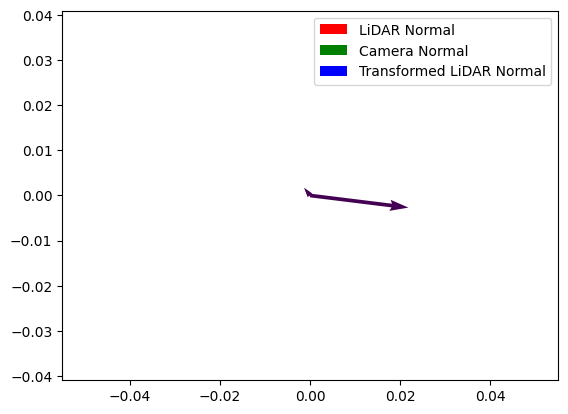

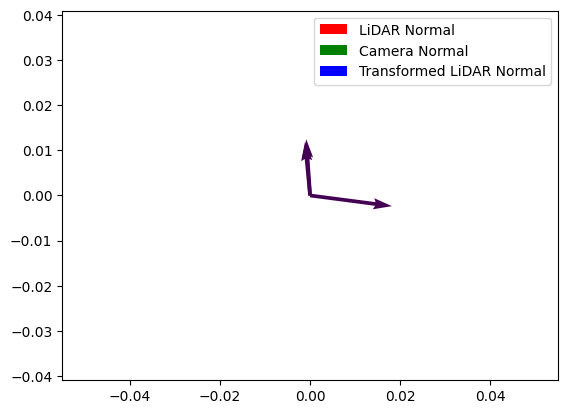

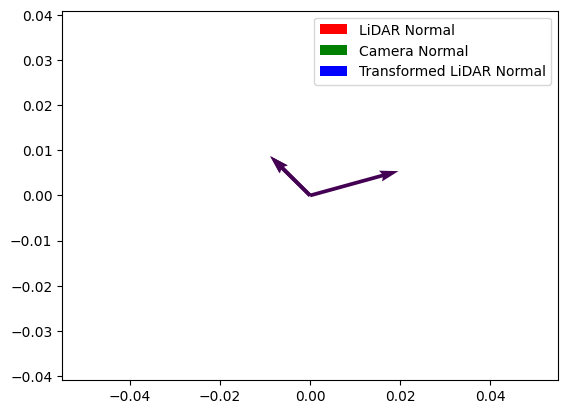

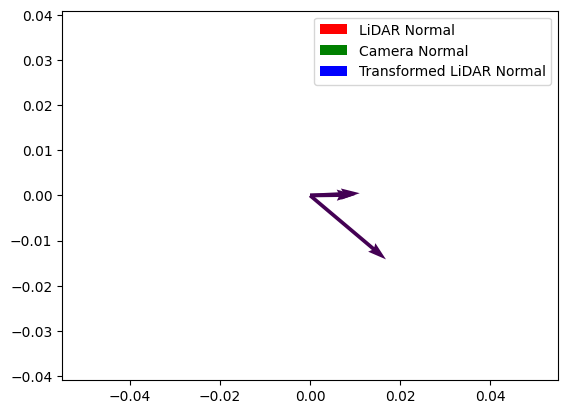

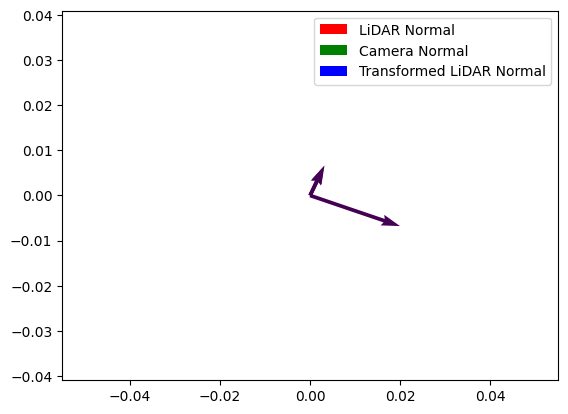

In [135]:
C_RL = transformation_matrix[:3, :3]
T = transformation_matrix[:3, 3]

count=0
for numbers in dict:
    if(count>=5):
      break
    n_L_i = dict[numbers]['normal_l']
    n_C_i = dict[numbers]['camera_normals.txt']
    n_transformed_i = np.dot(C_RL, n_L_i)  # Transform LiDAR normal to camera frame
    plot_normals(n_L_i, n_C_i, n_transformed_i)
    count+=1

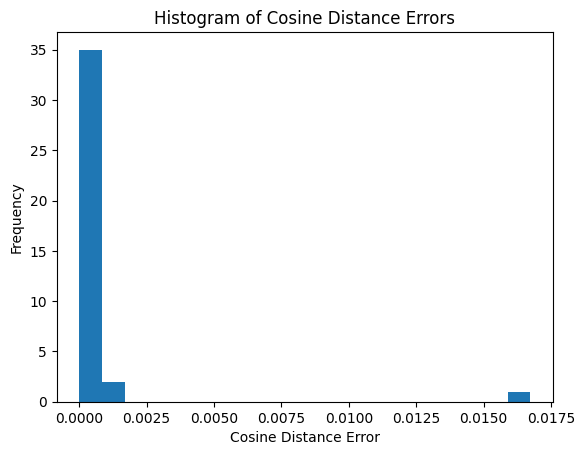

Average Error: 0.0006469021634402076
Standard Deviation: 0.002661000072088783


In [134]:
cosine_distances = []
for numbers in dict:
    n_L_i = dict[numbers]['normal_l']
    n_C_i = dict[numbers]['camera_normals.txt']
    n_transformed_i = np.dot(C_RL, n_L_i)  # Transform LiDAR normal to camera frame
    distance = cosine_distance(n_C_i, n_transformed_i)
    cosine_distances.append(distance)

# Plot histogram of errors
plt.hist(cosine_distances, bins=20)
plt.xlabel('Cosine Distance Error')
plt.ylabel('Frequency')
plt.title('Histogram of Cosine Distance Errors')
plt.show()

# Report average error and standard deviation
average_error = np.mean(cosine_distances)
std_deviation = np.std(cosine_distances)
print(f'Average Error: {average_error}')
print(f'Standard Deviation: {std_deviation}')